# 0. Instal object detection API

In [ ]:
# uncomment the next line if you want to delete an existing models directory
!rm -rf ./models/

# clone the Tensorflow Model Garden
!git clone --depth 1 https://github.com/tensorflow/models/

Cloning into 'models'...
remote: Enumerating objects: 3909, done.
remote: Counting objects: 100% (3909/3909), done.
remote: Compressing objects: 100% (3015/3015), done.
remote: Total 3909 (delta 1129), reused 2002 (delta 841), pack-reused 0
Receiving objects: 100% (3909/3909), 49.65 MiB | 16.00 MiB/s, done.
Resolving deltas: 100% (1129/1129), done.


In [ ]:
# Compile the Object Detection API protocol buffers
!cd models/research/ && protoc object_detection/protos/*.proto --python_out=.

In [ ]:
%%writefile models/research/setup.py

import os
from setuptools import find_packages
from setuptools import setup

REQUIRED_PACKAGES = [
    'tf-models-official==2.8.0',
    'tensorflow_io==0.24.0',
    'numpy==1.21.5'
]

setup(
    name='object_detection',
    version='0.1',
    install_requires=REQUIRED_PACKAGES,
    include_package_data=True,
    packages=(
        [p for p in find_packages() if p.startswith('object_detection')] +
        find_packages(where=os.path.join('.', 'slim'))),
    package_dir={
        'datasets': os.path.join('slim', 'datasets'),
        'nets': os.path.join('slim', 'nets'),
        'preprocessing': os.path.join('slim', 'preprocessing'),
        'deployment': os.path.join('slim', 'deployment'),
        'scripts': os.path.join('slim', 'scripts'),
    },
    description='Tensorflow Object Detection Library',
    python_requires='>3.6',
)

Writing models/research/setup.py


In [ ]:
# Run the setup script
!python -m pip install models/research

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing ./models/research
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 81.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.4/23.4 MB 63.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 95.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 91.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 25.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 94.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━

_Note: In Google Colab, you need to restart the runtime to finalize installing the packages. You can do so by selecting Runtime > Restart Runtime in the Menu bar. **Please do not proceed to the next section without restarting.**_

# 1. Import

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import zipfile
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

# 2. Utilities

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)


# 3. Id Card Data

In [ ]:
# uncomment the next 2 lines if you want to delete an existing zip and training directory
#!rm '/content/Id Card Dataset.zip'
#!rm -rf ./training

# replace this with the path to your id card zip file
local_zip = '/content/Id Card Dataset.zip'

# unzip to a local directory
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('.')
zip_ref.close()

# move the training images to the training directory
!mv './Id Card Dataset/Training' './training'


/content/training/1.jpg
/content/training/2.jpg
/content/training/3.jpg
/content/training/4.jpg
/content/training/5.jpg
/content/training/6.jpg
/content/training/7.jpg
/content/training/8.jpg
/content/training/9.jpg
/content/training/10.jpg
/content/training/11.jpg
/content/training/12.jpg
/content/training/13.jpg
/content/training/14.jpg
/content/training/15.jpg
/content/training/16.jpg
/content/training/17.jpg
/content/training/18.jpg
/content/training/19.jpg
/content/training/20.jpg
/content/training/21.jpg
/content/training/22.jpg
/content/training/23.JPG
/content/training/24.jpg
/content/training/25.jpg
/content/training/26.jpg
/content/training/27.jpg
/content/training/28.jpg
/content/training/29.jpg
/content/training/30.jpg
/content/training/31.jpg
/content/training/32.jpg
/content/training/33.jpg
/content/training/34.jpg
/content/training/35.jpg
/content/training/36.jpg
/content/training/37.JPG
/content/training/38.jpg
/content/training/39.jpg


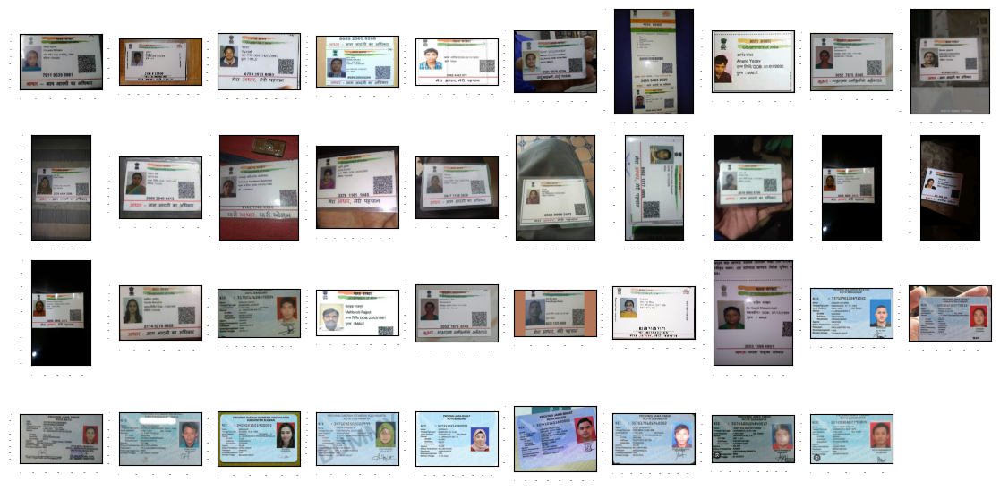

In [ ]:
%matplotlib inline

import math

# assign the name (string) of the directory containing the training images
train_image_dir = '/content/training'
train_images = os.listdir(train_image_dir)

# sort the list of image filenames
train_images.sort(key=lambda x: int(x.split('.')[0]))

# declare an empty list
train_images_np = []

# run a for loop for each image
for i in range(len(train_images)):

    # define the path (string) for each image
    image_name = train_images[i]
    image_path = os.path.join(train_image_dir, image_name)
    print(image_path)

    # load images into numpy arrays and append to a list
    train_images_np.append(load_image_into_numpy_array(image_path))

# configure plot settings via rcParams
plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14, 7]

# plot images
num_images = len(train_images_np)
num_cols = 10
num_rows = math.ceil(num_images / num_cols)

for idx, train_image_np in enumerate(train_images_np):
    plt.subplot(num_rows, num_cols, idx+1)
    plt.imshow(train_image_np)


# 4. Anotate Images with Your Own Bounding Box

In [ ]:
# Annotate the training images with bounding boxes
gt_boxes = []
# Use the colab_utils.annotate function to draw bounding boxes on the training images
colab_utils.annotate(train_images_np, box_storage_pointer=gt_boxes)



<IPython.core.display.Javascript object>

In [ ]:

# TEST CODE:
num_images = len(train_images_np)
try:
    assert(len(gt_boxes) == num_images), f"Warning: gt_boxes is empty or does not match the number of images ({num_images}). Did you click `submit`?"

except AssertionError as e:
    print(e)

# checks if there are boxes for all images
for gt_box in gt_boxes:
    try:
        assert(gt_box is not None), f"There are less than {num_images} sets of box coordinates. " \
                                    "Please re-run the cell above to draw the boxes again.\n" \
                                    "Alternatively, you can run the next cell to load pre-determined " \
                                    "ground truth boxes."

    except AssertionError as e:
        print(e)
        break


In [ ]:
# save your data in this option so that you can use it in the next time
'''
import csv

# define the name of the CSV file
csv_filename = 'id card boxes.csv'

# open the CSV file in write mode
with open(csv_filename, mode='w') as csv_file:
    # create a writer object
    writer = csv.writer(csv_file)

    # write the column names to the CSV file
    writer.writerow(['image_filename', 'ymin', 'xmin', 'ymax', 'xmax'])

    # write the data to the CSV file
    for image_name, gt_box in zip(train_images, gt_boxes):
        for box in gt_box:
            writer.writerow([image_name] + box.tolist())

print(f'Data saved to {csv_filename}')
'''

# 5. If You Already Has Bounding Box Data Previously

In [ ]:
import csv

gt_boxes = []  # uncomment to make empty list

# Option 2: use given ground truth boxes
# set this to `True` if you want to override the boxes you drew
override = True

# define the name of the CSV file
csv_filename = 'id card boxes.csv'

# read the data from the CSV file
with open(csv_filename, mode='r') as csv_file:
    # create a reader object
    reader = csv.reader(csv_file)

    # skip the first row (column names)
    next(reader)

    # read the data from the CSV file
    data = [row for row in reader]

# convert the data to a numpy array
ref_gt_boxes = np.array([[list(map(float, row[1:]))] for row in data], dtype=np.float32)

# if gt_boxes is empty or override is True , use the reference
if not gt_boxes or override is True:
    gt_boxes = ref_gt_boxes

# if gt_boxes does not contain the correct number of box coordinates,
# use the reference
for gt_box in gt_boxes:
    try:
        assert(gt_box is not None)

    except:
        gt_boxes = ref_gt_boxes
        break


In [ ]:
# print the coordinates of your ground truth boxes
for gt_box in gt_boxes:
  print(gt_box)

[[0.01776414 0.00364964 0.9744308  0.96350366]]
[[0.0944308  0.08502907 0.91109747 0.8235747 ]]
[[0.04276414 0.00239654 0.97109747 0.98087573]]
[[0.00611607 0.13986014 0.9644494  0.94055945]]
[[0.0094494  0.015625   0.98111606 0.9890625 ]]
[[0.1144494  0.11170213 0.8144494  0.8634752 ]]
[[0.74111605 0.2371134  0.99111605 0.8041237 ]]
[[0.0394494  0.02316602 0.9794494  0.96525097]]
[[0.09278274 0.03588291 0.9094494  0.9169027 ]]
[[0.28111607 0.12144703 0.6844494  0.8604651 ]]
[[0.31278273 0.06841216 0.6344494  0.9847973 ]]
[[0.05778274 0.03861004 0.8694494  0.980695  ]]
[[0.2344494  0.00515464 0.7927827  0.97422683]]
[[0.06278273 0.         0.75278276 0.94196427]]
[[0.12611607 0.08108108 0.8244494  0.9111969 ]]
[[0.4244494  0.04123711 0.8527827  0.9587629 ]]
[[0.05778274 0.08333334 0.8244494  0.97619045]]
[[0.2794494  0.07820513 0.6727827  0.87564105]]
[[0.3144494  0.00652174 0.6411161  0.88369566]]
[[0.3094494  0.00666667 0.68611604 0.7366667 ]]
[[0.31278273 0.00652174 0.65278274 0.884

# 6. Prepare Data For Training

In [ ]:
# By convention, our non-background classes start counting at 1.  Given
# that we will be predicting just one class, we will therefore assign it a
# `class id` of 1.
id_card_class_id = 1
num_classes = 1

category_index = {id_card_class_id: {'id': id_card_class_id, 'name': 'id_card'}}

# Convert class labels to one-hot; convert everything to tensors.
# The `label_id_offset` here shifts all classes by a certain number of indices;
# we do this here so that the model receives one-hot labels where non-background
# classes start counting at the zeroth index.  This is ordinarily just handled
# automatically in our training binaries, but we need to reproduce it here.
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []
for (train_image_np, gt_box_np) in zip(
    train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
      train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))
print('Done prepping data.')


Done prepping data.


# 7. Visualize The Id Card for Checking

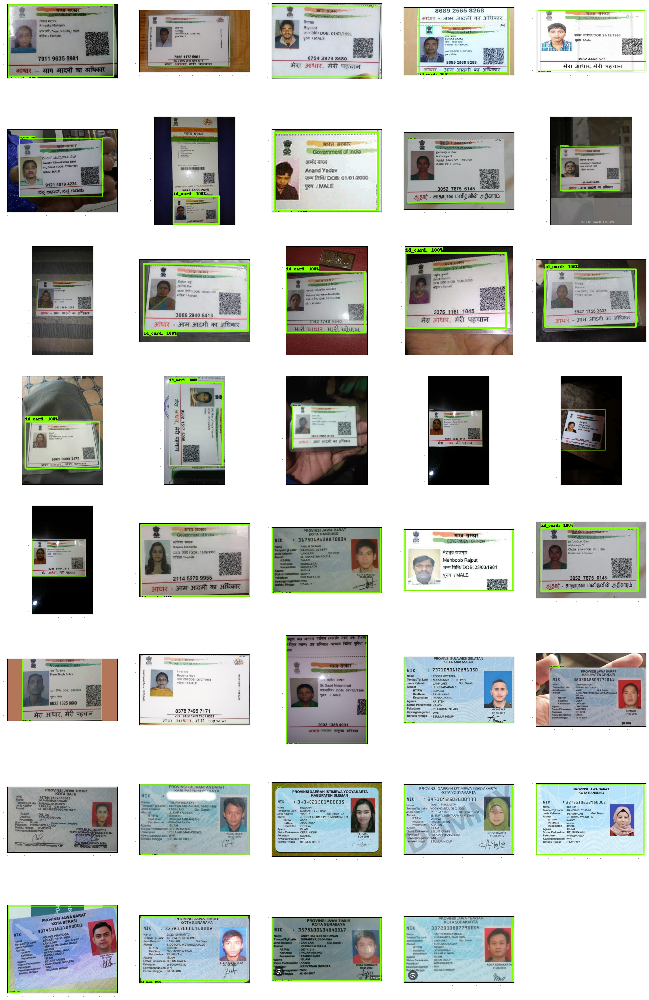

In [ ]:
dummy_scores = np.array([1.0], dtype=np.float32)  # give boxes a score of 100%

num_images = len(train_images_np)
num_cols = 5
num_rows = math.ceil(num_images / num_cols)

# Change the figsize to match your needs
plt.figure(figsize=(5 * num_cols, 5 * num_rows))
for idx in range(num_images):
  plt.subplot(num_rows, num_cols, idx+1)
  plot_detections(
      train_images_np[idx],
      gt_boxes[idx],
      np.ones(shape=[gt_boxes[idx].shape[0]], dtype=np.int32),
      dummy_scores, category_index)
plt.show()


# 8. Create Model and Restore Weight for All But last layer

In [ ]:
# Download the checkpoint and put it into models/research/object_detection/test_data/
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
!mv ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2023-06-14 19:34:29--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.175.128, 2404:6800:4003:c1c::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.175.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 244817203 (233M) [application/x-tar]
Saving to: ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’

ssd_resnet50_v1_fpn 100%[===================>] 233.48M   239MB/s    in 1.0s    

2023-06-14 19:34:31 (239 MB/s) - ‘ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz’ saved [244817203/244817203]



In [ ]:
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)
num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new id card class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

# Set up object-based checkpoint restore --- RetinaNet has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Building model and restoring weights for fine-tuning...
Weights restored!


# 9. Eager Mode Custom Training Loop

In [ ]:
tf.keras.backend.set_learning_phase(True)

# These parameters can be tuned; since our training set has 5 images
# it doesn't make sense to have a much larger batch size, though we could
# fit more examples in memory if we wanted to.
batch_size = 4
learning_rate = 0.01

batch_limit = int(input('input batch 10-80: '))
if batch_limit < 10:
  batch_limit = 10
elif (batch_limit >= 10)  and (batch_limit <= 80) and (batch_limit % 10 == 0):
  batch_limit = batch_limit
else:
  batch_limit = 80
num_batches = batch_limit

# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Set up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  """Get a tf.function for training step."""

  # Use tf.function for a bit of speed.
  # Comment out the tf.function decorator if you want the inside of the
  # function to run eagerly.
  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    """A single training iteration.

    Args:
      image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
        Note that the height and width can vary across images, as they are
        reshaped within this function to be 640x640.
      groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
        tf.float32 representing groundtruth boxes for each image in the batch.
      groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
        with type tf.float32 representing groundtruth boxes for each image in
        the batch.

    Returns:
      A scalar tensor representing the total loss for the input batch.
    """
    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(
    detection_model, optimizer, to_fine_tune)

print('Start fine-tuning!', flush=True)
for idx in range(num_batches):
  # Grab keys for a random subset of examples
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  # Note that we do not do data augmentation in this demo.  If you want a
  # a fun exercise, we recommend experimenting with random horizontal flipping
  # and random cropping :)
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  if idx % 10 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches)
    + ', loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

/usr/local/lib/python3.10/dist-packages/keras/backend.py:450: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


input batch 10-80: 70
Start fine-tuning!
batch 0 of 70, loss=1.1513585


batch 10 of 70, loss=0.5723536
batch 20 of 70, loss=0.33292848
batch 30 of 70, loss=0.30673963
batch 40 of 70, loss=0.19643249
batch 50 of 70, loss=0.1210828
batch 60 of 70, loss=0.112354904
Done fine-tuning!


# 10. Load Id Card Test Images

In [ ]:

test_image_dir = '/content/Id Card Dataset/Test'
test_images = os.listdir(test_image_dir)
test_images_np = []

for image_name in test_images:
    image_path = os.path.join(test_image_dir, image_name)
    test_images_np.append(np.expand_dims(
        load_image_into_numpy_array(image_path), axis=0))


# Again, uncomment this decorator if you want to run inference eagerly
@tf.function
def detect(input_tensor):
  """Run detection on an input image.

  Args:
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  prediction_dict = detection_model.predict(preprocessed_image, shapes)
  return detection_model.postprocess(prediction_dict, shapes)

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  detections = detect(input_tensor)

  plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name="gif_frame_" + ('%02d' % i) + ".jpg")

Imageio: 'libfreeimage-3.16.0-linux64.so' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-linux64.so (4.6 MB)
Downloading: 8192/4830080 bytes (0.2%)4830080/4830080 bytes (100.0%)
  Done
File saved as /root/.imageio/freeimage/libfreeimage-3.16.0-linux64.so.


<ipython-input-18-64e368c3cb8a>:10: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


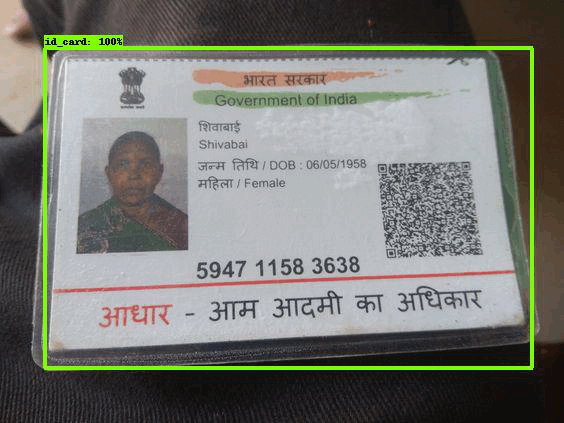

In [ ]:
imageio.plugins.freeimage.download()

anim_file = 'id_card_test.gif'

filenames = glob.glob('gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
  image = imageio.imread(filename)
  images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=0.5)

display(IPyImage(open(anim_file, 'rb').read()))

In [ ]:

# Create a directory to save the model
model_dir = "Id Card Detection Model"
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# Save the model
tf.saved_model.save(detection_model, model_dir)


In [ ]:
from google.colab import files
import shutil

# Create a zip file of the model directory
shutil.make_archive("Id Card Detection Model", "zip", "Id Card Detection Model")

# Create a download link for the zip file
files.download("Id Card Detection Model.zip")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>